In [1]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.io import read_image
import torchvision.transforms.functional as F_t
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets.utils import download_url
import matplotlib.pyplot as plt
from IPython import display
import cv2
from PIL import Image


try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [2]:
class RFF(nn.Module):
    def __init__(self, in_features, out_features, gamma):
        super().__init__()
        self.B = torch.randn(in_features, out_features)*gamma

    def forward(self, x):
        return torch.hstack([torch.sin(torch.matmul(2*math.pi*x, self.B)), torch.cos(torch.matmul(2*math.pi*x, self.B))])

In [9]:
class RFF_SR(nn.Module):
    def __init__(self, in_features, fourier_features, out_features, gamma):
        super().__init__()
        self.net = nn.Sequential(RFF(in_features, fourier_features, gamma), nn.Linear(2*fourier_features, out_features))

    def forward(self, x):
      return self.net(x)

In [4]:
def create_coord_map(image_path):
        image = read_image(image_path)
        h, w = image.shape[1], image.shape[2]
        image = image.float()/255
        image = image.permute(1, 2, 0)
        # print(image)

        h_coords = torch.linspace(0, 1, steps=h)
        w_coords = torch.linspace(0, 1, steps=w)
        grid = torch.stack(torch.meshgrid(h_coords, w_coords), dim=-1)
        # print(h, w)

        return grid, image

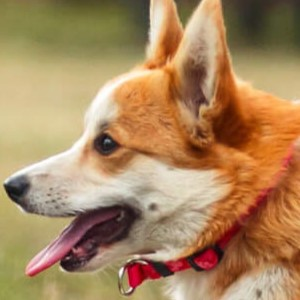

In [5]:
image_path = "dog.jpg"
display.Image(image_path)


In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

grid, image = create_coord_map(image_path)
# print(grid.shape, image.shape)
grid, image = grid.squeeze().to(device), image.squeeze().to(device)

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [7]:
# Create a 300x300 tensor with all values set to True
boolean_array = torch.full((300, 300), False, dtype=torch.bool)

# Generate 900 random indices
indices = torch.randperm(300*300)[:900]

# Set the randomly selected indices to False
boolean_array.view(-1)[indices] = True

boolean_array.sum()

tensor(900)

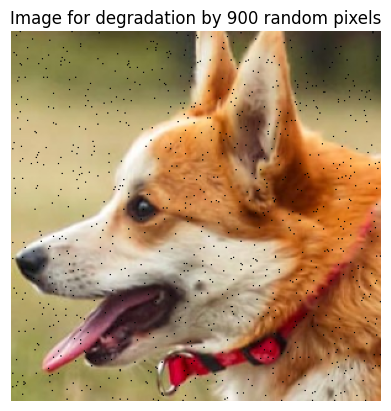

torch.Size([89100, 2]) torch.Size([89100, 3])
At iteration 1, the PSNR is 2.813788 and MSE loss is 0.523144
At iteration 2, the PSNR is 5.041833 and MSE loss is 0.313196
At iteration 3, the PSNR is 6.191108 and MSE loss is 0.240375
At iteration 4, the PSNR is 7.027745 and MSE loss is 0.198256
At iteration 5, the PSNR is 7.991674 and MSE loss is 0.158793
At iteration 6, the PSNR is 9.118527 and MSE loss is 0.122503
At iteration 7, the PSNR is 10.285358 and MSE loss is 0.093641
At iteration 8, the PSNR is 11.331092 and MSE loss is 0.073602
At iteration 9, the PSNR is 12.160550 and MSE loss is 0.060806


At iteration 10, the PSNR is 12.785826 and MSE loss is 0.052652


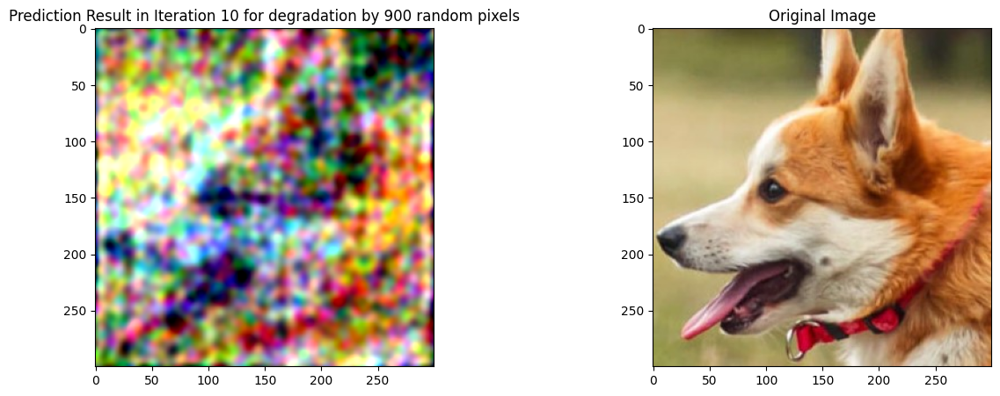

At iteration 11, the PSNR is 13.269974 and MSE loss is 0.047098
At iteration 12, the PSNR is 13.667715 and MSE loss is 0.042976
At iteration 13, the PSNR is 14.003475 and MSE loss is 0.039779
At iteration 14, the PSNR is 14.284264 and MSE loss is 0.037288
At iteration 15, the PSNR is 14.515488 and MSE loss is 0.035355
At iteration 16, the PSNR is 14.719425 and MSE loss is 0.033733
At iteration 17, the PSNR is 14.945798 and MSE loss is 0.032020
At iteration 18, the PSNR is 15.229157 and MSE loss is 0.029997
At iteration 19, the PSNR is 15.539991 and MSE loss is 0.027925


At iteration 20, the PSNR is 15.815790 and MSE loss is 0.026207


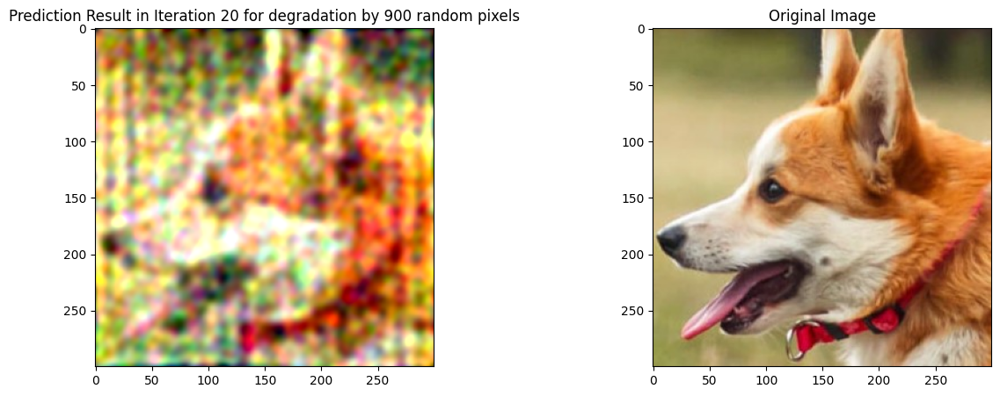

At iteration 21, the PSNR is 16.050230 and MSE loss is 0.024830
At iteration 22, the PSNR is 16.308558 and MSE loss is 0.023396
At iteration 23, the PSNR is 16.650707 and MSE loss is 0.021624
At iteration 24, the PSNR is 17.079086 and MSE loss is 0.019593
At iteration 25, the PSNR is 17.548542 and MSE loss is 0.017585
At iteration 26, the PSNR is 18.006281 and MSE loss is 0.015826
At iteration 27, the PSNR is 18.426865 and MSE loss is 0.014365
At iteration 28, the PSNR is 18.813761 and MSE loss is 0.013141
At iteration 29, the PSNR is 19.184237 and MSE loss is 0.012066


At iteration 30, the PSNR is 19.566559 and MSE loss is 0.011050


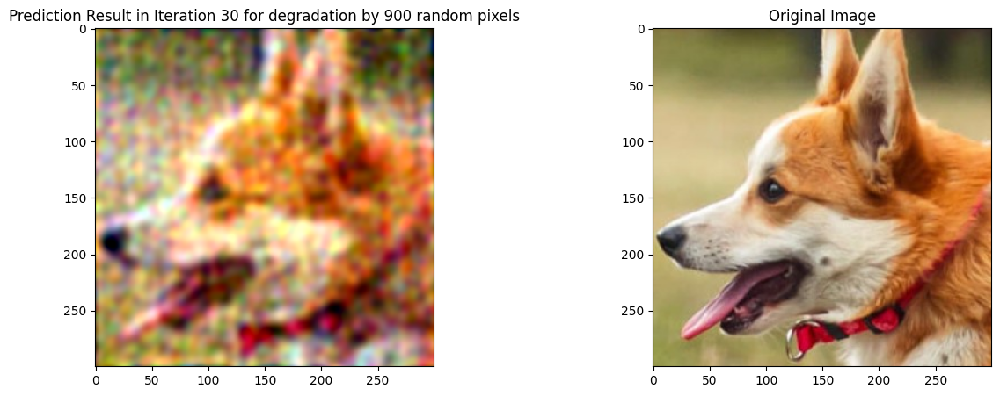

At iteration 31, the PSNR is 19.986551 and MSE loss is 0.010031
At iteration 32, the PSNR is 20.449581 and MSE loss is 0.009017
At iteration 33, the PSNR is 20.938480 and MSE loss is 0.008057
At iteration 34, the PSNR is 21.409233 and MSE loss is 0.007229
At iteration 35, the PSNR is 21.808298 and MSE loss is 0.006594
At iteration 36, the PSNR is 22.116318 and MSE loss is 0.006143
At iteration 37, the PSNR is 22.366100 and MSE loss is 0.005799
At iteration 38, the PSNR is 22.602314 and MSE loss is 0.005492
At iteration 39, the PSNR is 22.821362 and MSE loss is 0.005222


At iteration 40, the PSNR is 22.987801 and MSE loss is 0.005026


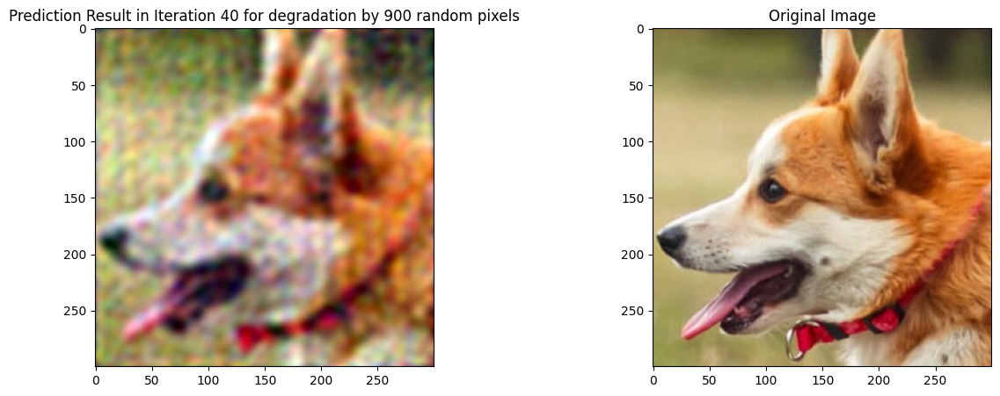

At iteration 41, the PSNR is 23.107368 and MSE loss is 0.004889
At iteration 42, the PSNR is 23.221472 and MSE loss is 0.004763
At iteration 43, the PSNR is 23.350040 and MSE loss is 0.004624
At iteration 44, the PSNR is 23.482178 and MSE loss is 0.004485
At iteration 45, the PSNR is 23.614243 and MSE loss is 0.004351
At iteration 46, the PSNR is 23.771973 and MSE loss is 0.004196
At iteration 47, the PSNR is 23.976889 and MSE loss is 0.004002
At iteration 48, the PSNR is 24.212784 and MSE loss is 0.003791
At iteration 49, the PSNR is 24.437483 and MSE loss is 0.003600


At iteration 50, the PSNR is 24.628466 and MSE loss is 0.003445


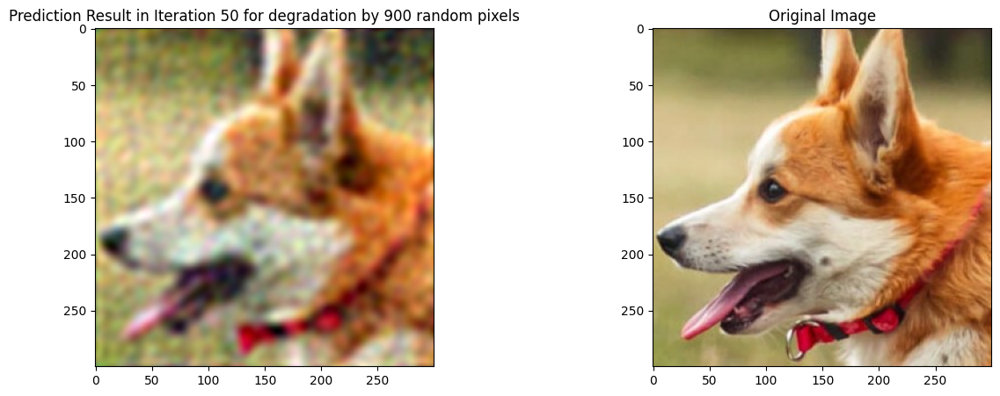

At iteration 51, the PSNR is 24.800856 and MSE loss is 0.003311
At iteration 52, the PSNR is 24.972370 and MSE loss is 0.003182
At iteration 53, the PSNR is 25.145279 and MSE loss is 0.003058
At iteration 54, the PSNR is 25.307549 and MSE loss is 0.002946
At iteration 55, the PSNR is 25.439236 and MSE loss is 0.002858
At iteration 56, the PSNR is 25.533382 and MSE loss is 0.002797
At iteration 57, the PSNR is 25.602667 and MSE loss is 0.002753
At iteration 58, the PSNR is 25.662254 and MSE loss is 0.002715
At iteration 59, the PSNR is 25.719469 and MSE loss is 0.002679


At iteration 60, the PSNR is 25.777775 and MSE loss is 0.002644


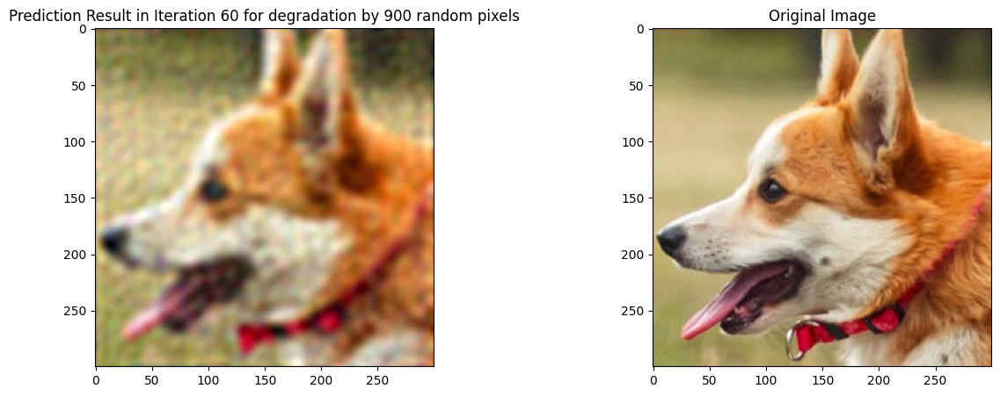

At iteration 61, the PSNR is 25.836254 and MSE loss is 0.002608
At iteration 62, the PSNR is 25.895271 and MSE loss is 0.002573
At iteration 63, the PSNR is 25.957905 and MSE loss is 0.002536
At iteration 64, the PSNR is 26.017628 and MSE loss is 0.002502
At iteration 65, the PSNR is 26.068600 and MSE loss is 0.002473
At iteration 66, the PSNR is 26.116482 and MSE loss is 0.002445
At iteration 67, the PSNR is 26.163963 and MSE loss is 0.002419
At iteration 68, the PSNR is 26.206173 and MSE loss is 0.002395
At iteration 69, the PSNR is 26.242105 and MSE loss is 0.002376


At iteration 70, the PSNR is 26.276367 and MSE loss is 0.002357


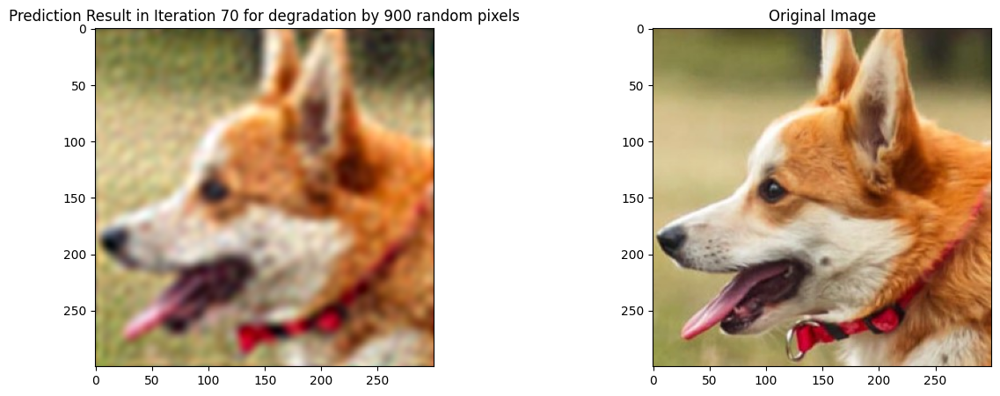

At iteration 71, the PSNR is 26.311279 and MSE loss is 0.002338
At iteration 72, the PSNR is 26.344189 and MSE loss is 0.002320
At iteration 73, the PSNR is 26.373138 and MSE loss is 0.002305
At iteration 74, the PSNR is 26.399862 and MSE loss is 0.002291
At iteration 75, the PSNR is 26.426765 and MSE loss is 0.002277
At iteration 76, the PSNR is 26.453854 and MSE loss is 0.002263
At iteration 77, the PSNR is 26.478394 and MSE loss is 0.002250
At iteration 78, the PSNR is 26.497978 and MSE loss is 0.002240
At iteration 79, the PSNR is 26.513771 and MSE loss is 0.002232


At iteration 80, the PSNR is 26.527929 and MSE loss is 0.002224


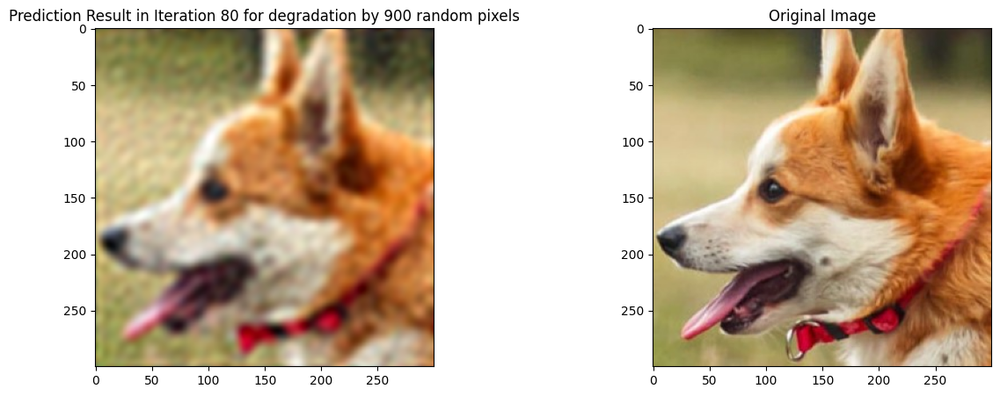

At iteration 81, the PSNR is 26.541149 and MSE loss is 0.002218
At iteration 82, the PSNR is 26.553425 and MSE loss is 0.002211
At iteration 83, the PSNR is 26.564415 and MSE loss is 0.002206
At iteration 84, the PSNR is 26.574486 and MSE loss is 0.002201
At iteration 85, the PSNR is 26.585480 and MSE loss is 0.002195
At iteration 86, the PSNR is 26.597710 and MSE loss is 0.002189
At iteration 87, the PSNR is 26.609442 and MSE loss is 0.002183
At iteration 88, the PSNR is 26.619781 and MSE loss is 0.002178
At iteration 89, the PSNR is 26.629629 and MSE loss is 0.002173


At iteration 90, the PSNR is 26.639719 and MSE loss is 0.002168


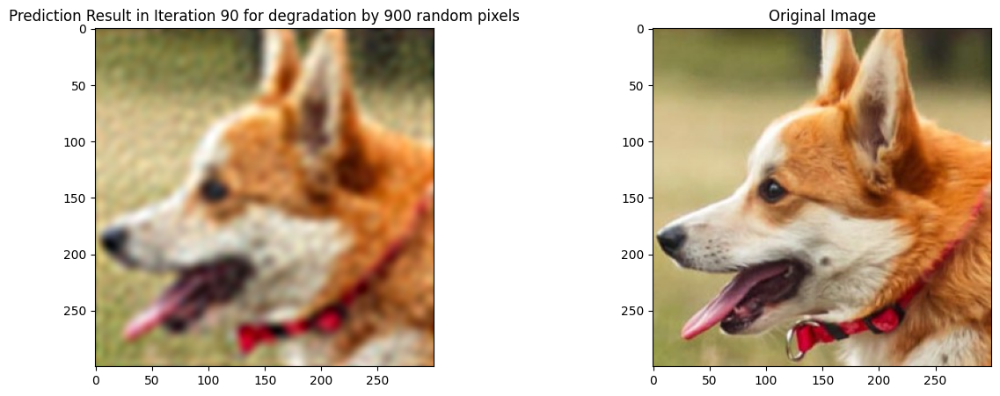

At iteration 91, the PSNR is 26.649590 and MSE loss is 0.002163
At iteration 92, the PSNR is 26.658436 and MSE loss is 0.002159
At iteration 93, the PSNR is 26.666599 and MSE loss is 0.002154
At iteration 94, the PSNR is 26.674726 and MSE loss is 0.002150
At iteration 95, the PSNR is 26.682468 and MSE loss is 0.002147
At iteration 96, the PSNR is 26.689495 and MSE loss is 0.002143
At iteration 97, the PSNR is 26.696014 and MSE loss is 0.002140
At iteration 98, the PSNR is 26.702084 and MSE loss is 0.002137
At iteration 99, the PSNR is 26.707653 and MSE loss is 0.002134


At iteration 100, the PSNR is 26.713018 and MSE loss is 0.002132


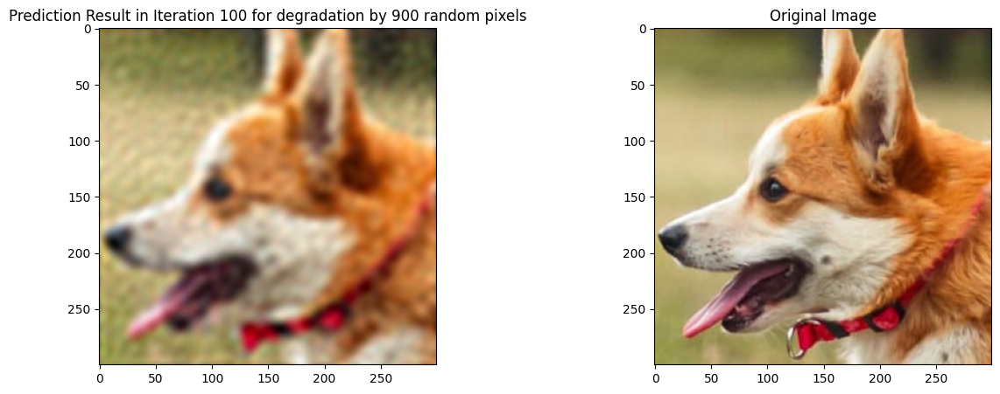

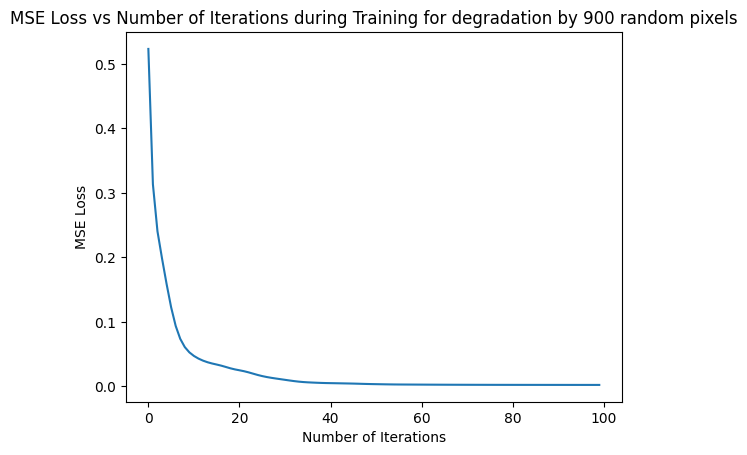

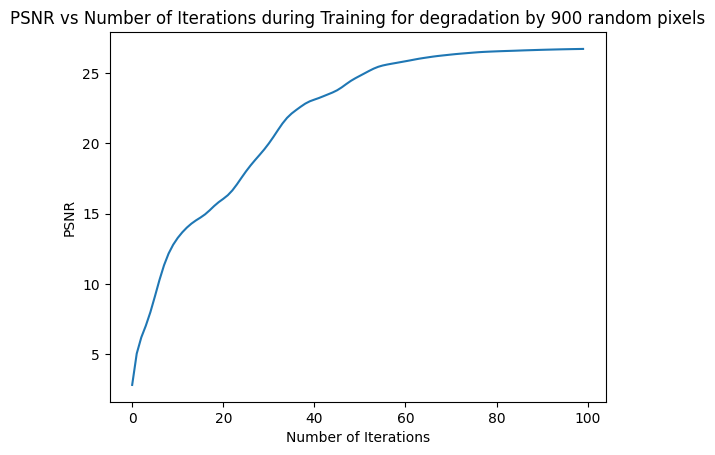

In [12]:

# Create a 3D grid array of coordinates
x = torch.linspace(-1, 1, 300)
y = torch.linspace(-1, 1, 300)
X, Y = torch.meshgrid(x, y)


# Apply the boolean mask to the image array
masked_image = image.clone()
masked_image[boolean_array, ] = -1

# Display the masked image without missing points
plt.figure()
plt.imshow(masked_image)
plt.title(f"Image for degradation by {900} random pixels")
plt.axis('off')
plt.show()


train_coords, train_rgbs = grid[masked_image[:,:,0]!=-1].reshape(-1, 2), image[masked_image!=-1].reshape(-1, 3)  # use every other pixel for training
print(train_coords.shape, train_rgbs.shape)
test_coords = grid.reshape(-1, 2) # use all the pixels for evaluation
SuperReso = RFF_SR(2, 1000, 3, gamma=10).to(device)
optimizer = torch.optim.Adam(SuperReso.parameters(), lr=0.01)
train_mse_arr = []
train_psnr_arr = []

for iter in range(1, 101):
    SuperReso.train()
    optimizer.zero_grad()
    output = SuperReso(train_coords)
    train_loss = F.mse_loss(output, train_rgbs)
    train_loss.backward()
    optimizer.step()
    train_mse_arr.append(train_loss.item())
    train_psnr_arr.append(-10*torch.log10(train_loss))

    with torch.no_grad():
        prediction = SuperReso(test_coords)
        print(f"At iteration {iter}, the PSNR is {-10*torch.log10(train_loss):.6f} and MSE loss is {train_loss.item():.6f}")
    if iter % 10 == 0:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        axes[0].imshow(prediction.reshape(image.shape[0], image.shape[1], image.shape[2]).cpu())
        axes[0].set_title(f"Prediction Result in Iteration {iter} for degradation by {900} random pixels")
        axes[1].imshow(image.cpu())
        axes[1].set_title(f"Original Image")
        plt.show()

plt.figure()
plt.plot(train_mse_arr)
plt.xlabel("Number of Iterations")
plt.ylabel("MSE Loss")
plt.title(f"MSE Loss vs Number of Iterations during Training for degradation by {900} random pixels")
plt.show()

for i in range(len(train_psnr_arr)):
    train_psnr_arr[i] = train_psnr_arr[i].item()
plt.figure()
plt.plot(train_psnr_arr)
plt.xlabel("Number of Iterations")
plt.ylabel("PSNR")
plt.title(f"PSNR vs Number of Iterations during Training for degradation by {900} random pixels")
plt.show()


In [13]:
# Create a 300x300 tensor with all values set to True
boolean_array = torch.full((300, 300), False, dtype=torch.bool)

boolean_array[100:130, 150:180] = True

boolean_array.sum()

tensor(900)

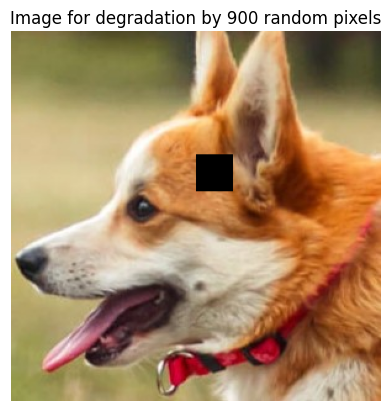

torch.Size([89100, 2]) torch.Size([89100, 3])
At iteration 1, the PSNR is 2.940762 and MSE loss is 0.508070
At iteration 2, the PSNR is 5.010247 and MSE loss is 0.315482
At iteration 3, the PSNR is 5.797643 and MSE loss is 0.263170
At iteration 4, the PSNR is 6.391790 and MSE loss is 0.229520
At iteration 5, the PSNR is 7.218238 and MSE loss is 0.189748
At iteration 6, the PSNR is 8.158344 and MSE loss is 0.152815
At iteration 7, the PSNR is 9.008351 and MSE loss is 0.125651
At iteration 8, the PSNR is 9.743015 and MSE loss is 0.106096
At iteration 9, the PSNR is 10.486391 and MSE loss is 0.089405


At iteration 10, the PSNR is 11.304419 and MSE loss is 0.074056


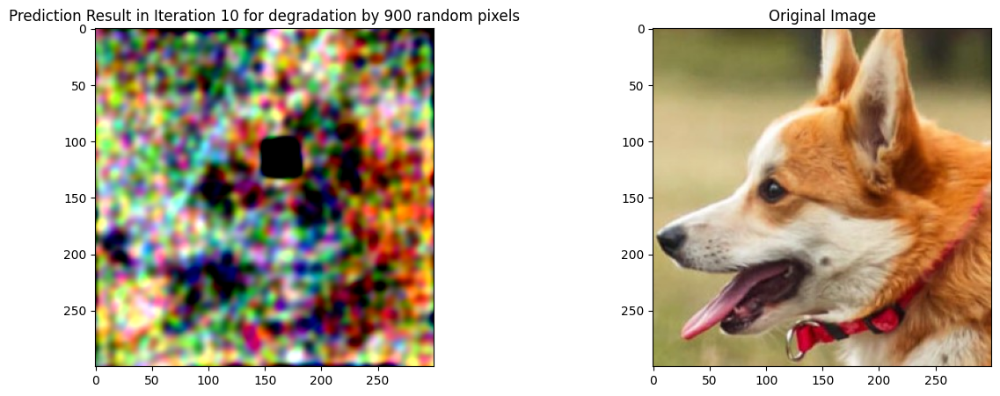

At iteration 11, the PSNR is 12.149533 and MSE loss is 0.060960
At iteration 12, the PSNR is 12.912383 and MSE loss is 0.051140
At iteration 13, the PSNR is 13.540158 and MSE loss is 0.044257
At iteration 14, the PSNR is 14.084253 and MSE loss is 0.039046
At iteration 15, the PSNR is 14.602555 and MSE loss is 0.034653
At iteration 16, the PSNR is 15.084052 and MSE loss is 0.031017
At iteration 17, the PSNR is 15.472517 and MSE loss is 0.028363
At iteration 18, the PSNR is 15.751074 and MSE loss is 0.026601
At iteration 19, the PSNR is 15.972873 and MSE loss is 0.025276


At iteration 20, the PSNR is 16.195412 and MSE loss is 0.024014


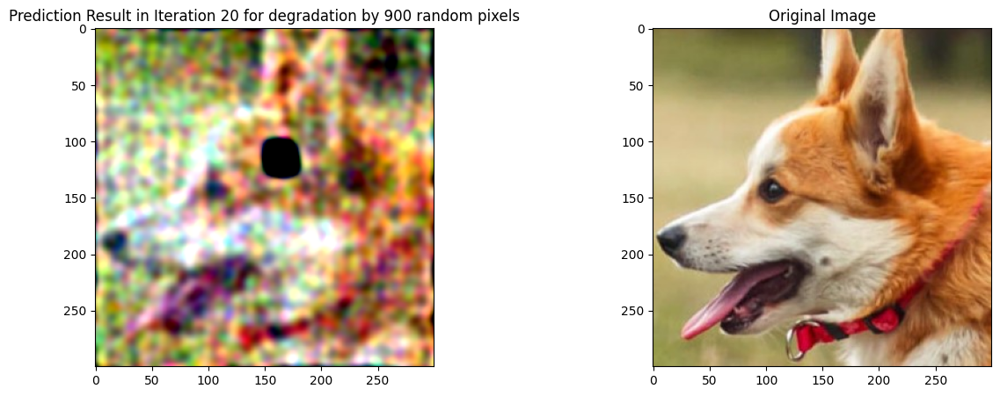

At iteration 21, the PSNR is 16.418612 and MSE loss is 0.022811
At iteration 22, the PSNR is 16.607391 and MSE loss is 0.021840
At iteration 23, the PSNR is 16.766191 and MSE loss is 0.021056
At iteration 24, the PSNR is 16.950142 and MSE loss is 0.020183
At iteration 25, the PSNR is 17.192635 and MSE loss is 0.019087
At iteration 26, the PSNR is 17.474489 and MSE loss is 0.017888
At iteration 27, the PSNR is 17.761572 and MSE loss is 0.016743
At iteration 28, the PSNR is 18.036667 and MSE loss is 0.015716
At iteration 29, the PSNR is 18.308296 and MSE loss is 0.014763


At iteration 30, the PSNR is 18.604078 and MSE loss is 0.013791


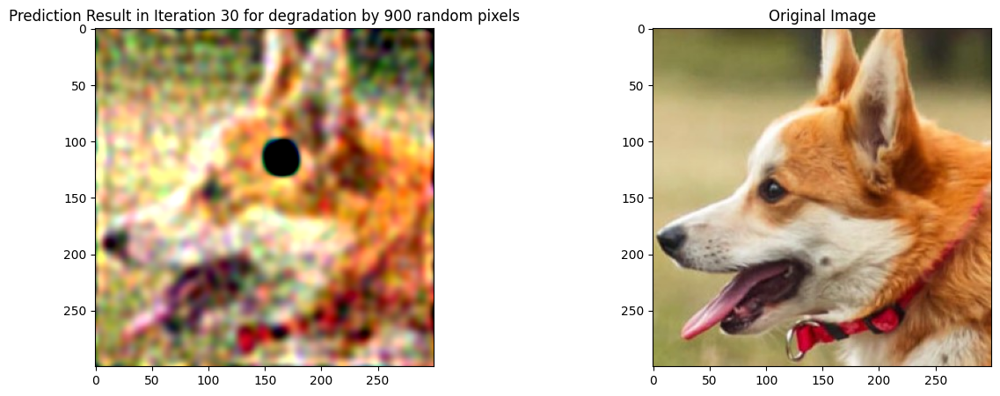

At iteration 31, the PSNR is 18.949808 and MSE loss is 0.012736
At iteration 32, the PSNR is 19.343775 and MSE loss is 0.011631
At iteration 33, the PSNR is 19.747116 and MSE loss is 0.010600
At iteration 34, the PSNR is 20.113268 and MSE loss is 0.009743
At iteration 35, the PSNR is 20.438395 and MSE loss is 0.009040
At iteration 36, the PSNR is 20.765259 and MSE loss is 0.008384
At iteration 37, the PSNR is 21.124659 and MSE loss is 0.007719
At iteration 38, the PSNR is 21.486128 and MSE loss is 0.007102
At iteration 39, the PSNR is 21.789307 and MSE loss is 0.006623


At iteration 40, the PSNR is 22.021578 and MSE loss is 0.006278


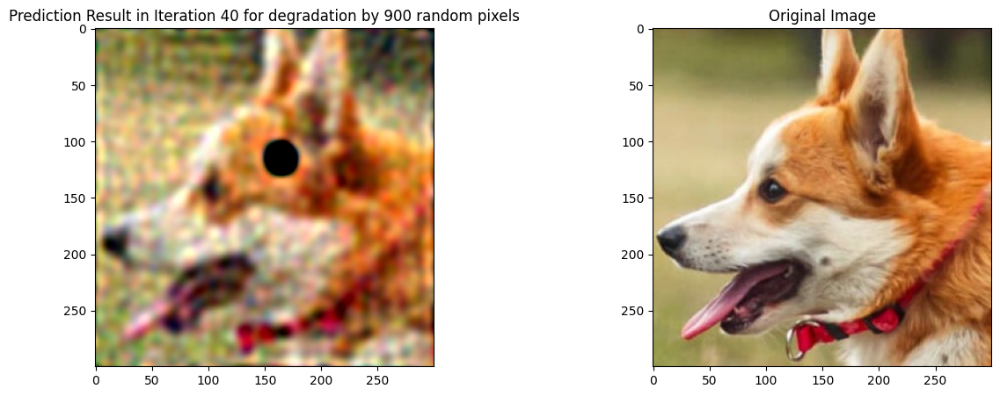

At iteration 41, the PSNR is 22.229193 and MSE loss is 0.005985
At iteration 42, the PSNR is 22.454365 and MSE loss is 0.005683
At iteration 43, the PSNR is 22.688353 and MSE loss is 0.005385
At iteration 44, the PSNR is 22.893793 and MSE loss is 0.005136
At iteration 45, the PSNR is 23.054356 and MSE loss is 0.004950
At iteration 46, the PSNR is 23.190189 and MSE loss is 0.004797
At iteration 47, the PSNR is 23.330881 and MSE loss is 0.004644
At iteration 48, the PSNR is 23.486387 and MSE loss is 0.004481
At iteration 49, the PSNR is 23.648914 and MSE loss is 0.004316


At iteration 50, the PSNR is 23.802498 and MSE loss is 0.004166


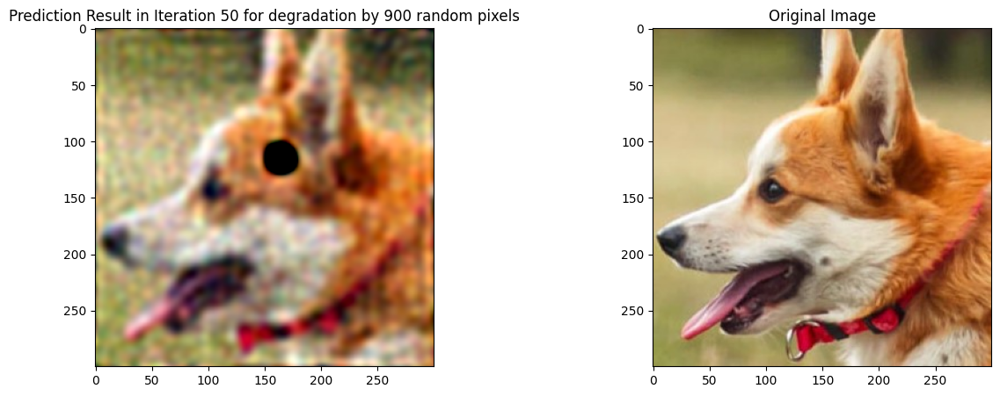

At iteration 51, the PSNR is 23.932398 and MSE loss is 0.004044
At iteration 52, the PSNR is 24.041445 and MSE loss is 0.003943
At iteration 53, the PSNR is 24.148314 and MSE loss is 0.003847
At iteration 54, the PSNR is 24.261642 and MSE loss is 0.003748
At iteration 55, the PSNR is 24.372299 and MSE loss is 0.003654
At iteration 56, the PSNR is 24.474216 and MSE loss is 0.003569
At iteration 57, the PSNR is 24.575642 and MSE loss is 0.003487
At iteration 58, the PSNR is 24.679852 and MSE loss is 0.003404
At iteration 59, the PSNR is 24.777029 and MSE loss is 0.003329


At iteration 60, the PSNR is 24.865980 and MSE loss is 0.003261


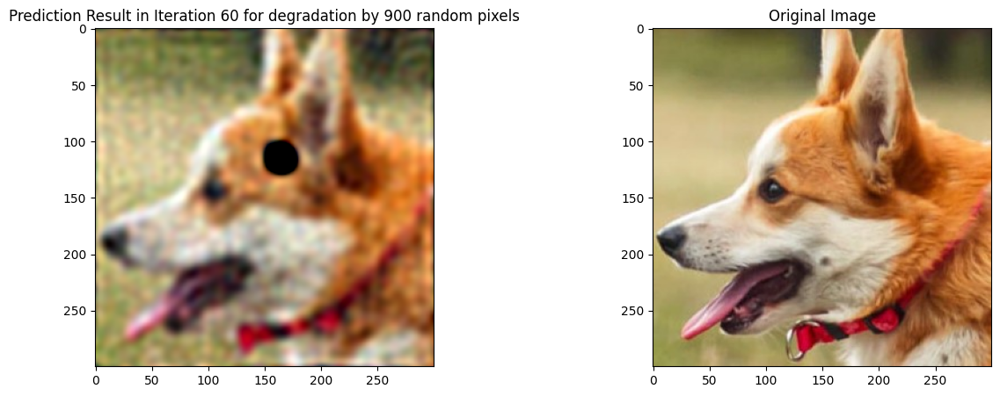

At iteration 61, the PSNR is 24.956432 and MSE loss is 0.003194
At iteration 62, the PSNR is 25.046890 and MSE loss is 0.003128
At iteration 63, the PSNR is 25.129290 and MSE loss is 0.003070
At iteration 64, the PSNR is 25.205366 and MSE loss is 0.003016
At iteration 65, the PSNR is 25.279119 and MSE loss is 0.002965
At iteration 66, the PSNR is 25.347576 and MSE loss is 0.002919
At iteration 67, the PSNR is 25.407600 and MSE loss is 0.002879
At iteration 68, the PSNR is 25.460953 and MSE loss is 0.002844
At iteration 69, the PSNR is 25.510063 and MSE loss is 0.002812


At iteration 70, the PSNR is 25.555428 and MSE loss is 0.002783


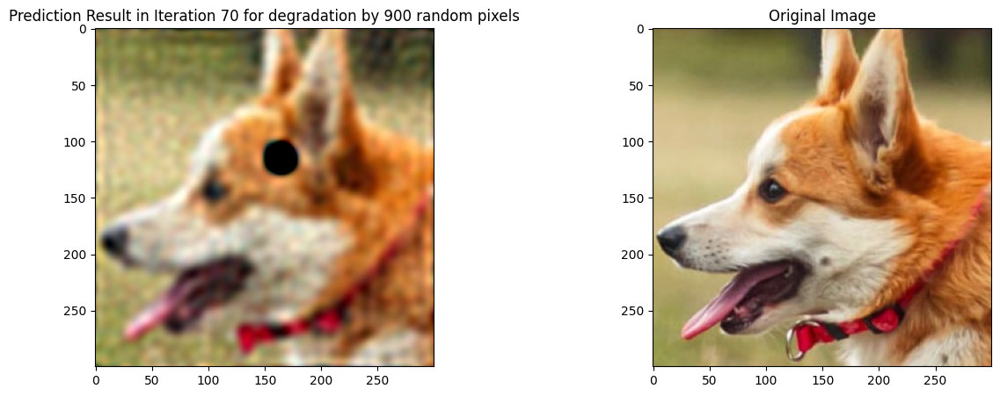

At iteration 71, the PSNR is 25.595991 and MSE loss is 0.002757
At iteration 72, the PSNR is 25.632694 and MSE loss is 0.002734
At iteration 73, the PSNR is 25.668774 and MSE loss is 0.002711
At iteration 74, the PSNR is 25.705772 and MSE loss is 0.002688
At iteration 75, the PSNR is 25.741903 and MSE loss is 0.002666
At iteration 76, the PSNR is 25.775963 and MSE loss is 0.002645
At iteration 77, the PSNR is 25.809540 and MSE loss is 0.002624
At iteration 78, the PSNR is 25.843838 and MSE loss is 0.002604
At iteration 79, the PSNR is 25.877455 and MSE loss is 0.002584


At iteration 80, the PSNR is 25.909090 and MSE loss is 0.002565


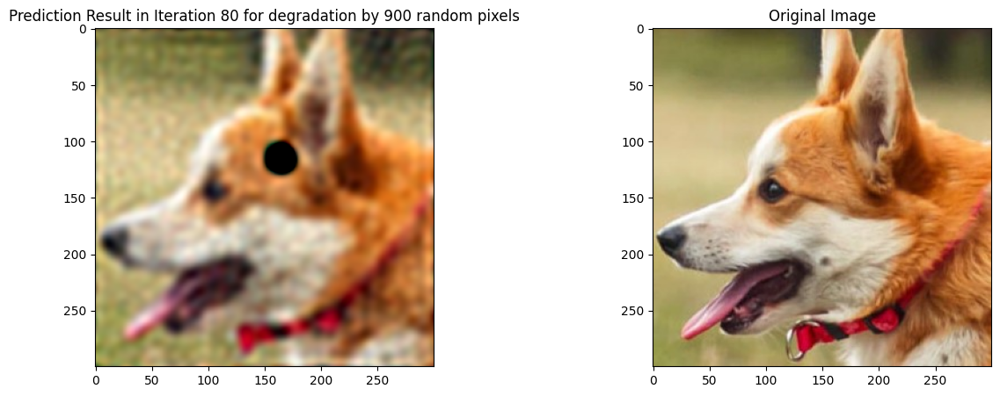

At iteration 81, the PSNR is 25.938652 and MSE loss is 0.002548
At iteration 82, the PSNR is 25.966640 and MSE loss is 0.002531
At iteration 83, the PSNR is 25.993235 and MSE loss is 0.002516
At iteration 84, the PSNR is 26.018024 and MSE loss is 0.002501
At iteration 85, the PSNR is 26.041239 and MSE loss is 0.002488
At iteration 86, the PSNR is 26.063915 and MSE loss is 0.002475
At iteration 87, the PSNR is 26.086227 and MSE loss is 0.002463
At iteration 88, the PSNR is 26.107752 and MSE loss is 0.002450
At iteration 89, the PSNR is 26.128174 and MSE loss is 0.002439


At iteration 90, the PSNR is 26.147726 and MSE loss is 0.002428


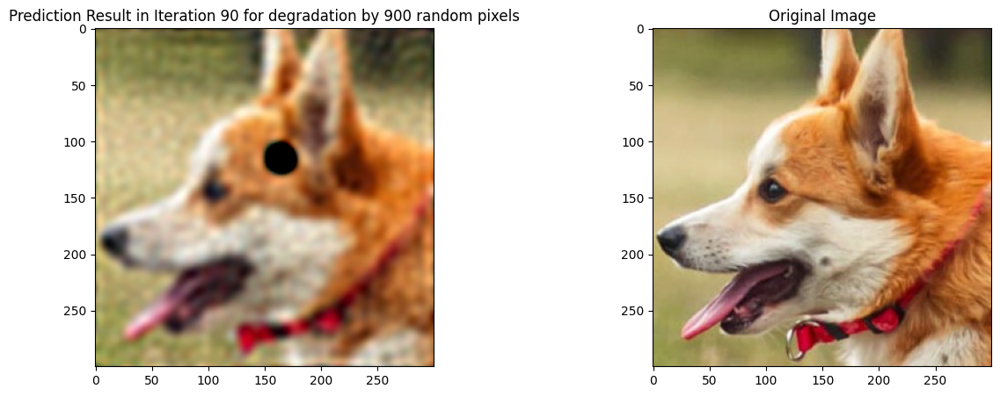

At iteration 91, the PSNR is 26.166695 and MSE loss is 0.002417
At iteration 92, the PSNR is 26.184906 and MSE loss is 0.002407
At iteration 93, the PSNR is 26.202433 and MSE loss is 0.002397
At iteration 94, the PSNR is 26.219625 and MSE loss is 0.002388
At iteration 95, the PSNR is 26.236477 and MSE loss is 0.002379
At iteration 96, the PSNR is 26.252430 and MSE loss is 0.002370
At iteration 97, the PSNR is 26.267490 and MSE loss is 0.002362
At iteration 98, the PSNR is 26.282309 and MSE loss is 0.002354
At iteration 99, the PSNR is 26.296860 and MSE loss is 0.002346


At iteration 100, the PSNR is 26.310835 and MSE loss is 0.002338


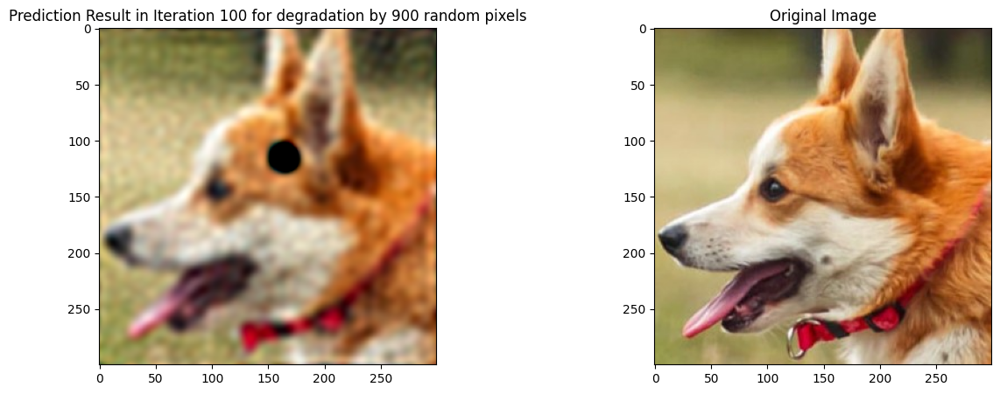

At iteration 101, the PSNR is 26.324308 and MSE loss is 0.002331
At iteration 102, the PSNR is 26.337456 and MSE loss is 0.002324
At iteration 103, the PSNR is 26.350363 and MSE loss is 0.002317
At iteration 104, the PSNR is 26.363047 and MSE loss is 0.002310
At iteration 105, the PSNR is 26.375450 and MSE loss is 0.002304
At iteration 106, the PSNR is 26.387501 and MSE loss is 0.002297
At iteration 107, the PSNR is 26.399208 and MSE loss is 0.002291
At iteration 108, the PSNR is 26.410601 and MSE loss is 0.002285
At iteration 109, the PSNR is 26.421722 and MSE loss is 0.002279


At iteration 110, the PSNR is 26.432541 and MSE loss is 0.002274


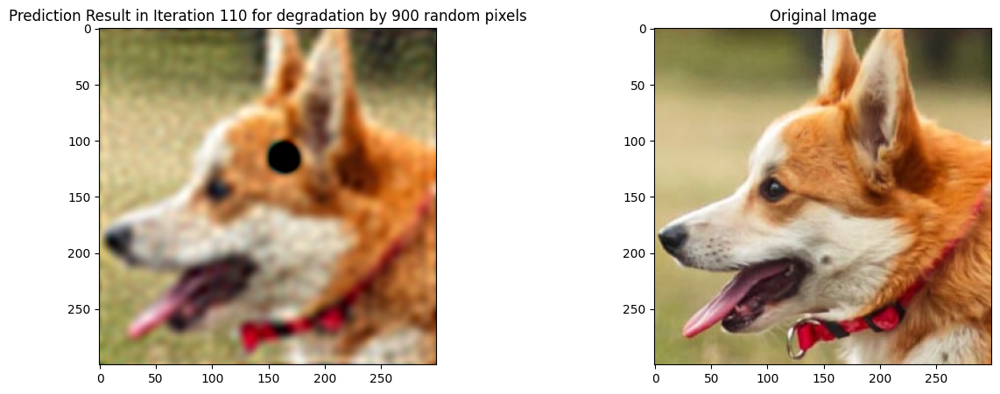

At iteration 111, the PSNR is 26.443022 and MSE loss is 0.002268
At iteration 112, the PSNR is 26.453175 and MSE loss is 0.002263
At iteration 113, the PSNR is 26.463011 and MSE loss is 0.002258
At iteration 114, the PSNR is 26.472609 and MSE loss is 0.002253
At iteration 115, the PSNR is 26.482012 and MSE loss is 0.002248
At iteration 116, the PSNR is 26.491180 and MSE loss is 0.002243
At iteration 117, the PSNR is 26.500111 and MSE loss is 0.002239
At iteration 118, the PSNR is 26.508846 and MSE loss is 0.002234
At iteration 119, the PSNR is 26.517380 and MSE loss is 0.002230


At iteration 120, the PSNR is 26.525747 and MSE loss is 0.002225


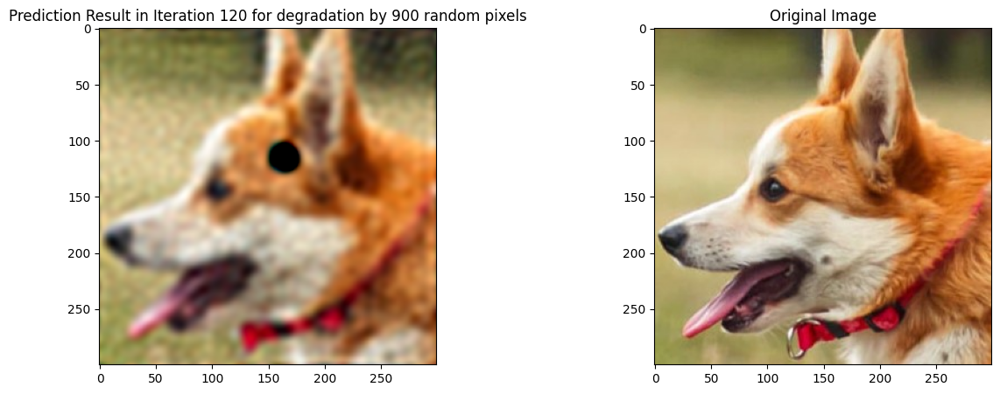

At iteration 121, the PSNR is 26.533989 and MSE loss is 0.002221
At iteration 122, the PSNR is 26.542065 and MSE loss is 0.002217
At iteration 123, the PSNR is 26.549923 and MSE loss is 0.002213
At iteration 124, the PSNR is 26.557583 and MSE loss is 0.002209
At iteration 125, the PSNR is 26.565073 and MSE loss is 0.002205
At iteration 126, the PSNR is 26.572403 and MSE loss is 0.002202
At iteration 127, the PSNR is 26.579580 and MSE loss is 0.002198
At iteration 128, the PSNR is 26.586580 and MSE loss is 0.002195
At iteration 129, the PSNR is 26.593407 and MSE loss is 0.002191


At iteration 130, the PSNR is 26.600086 and MSE loss is 0.002188


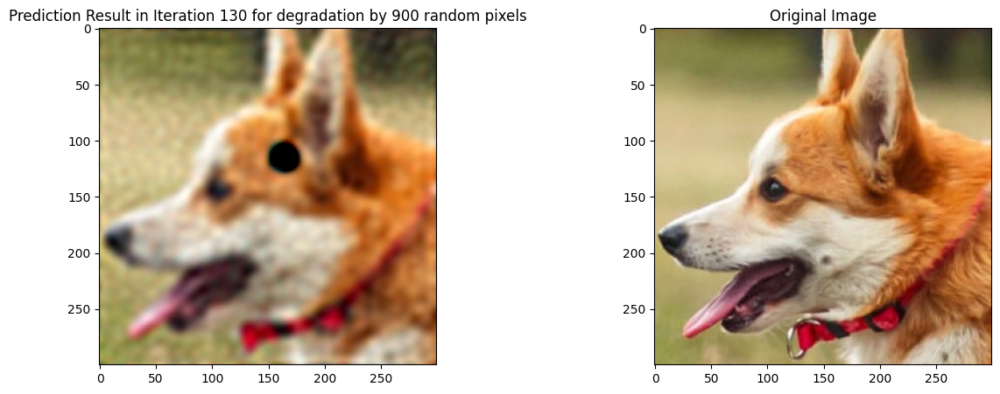

At iteration 131, the PSNR is 26.606634 and MSE loss is 0.002184
At iteration 132, the PSNR is 26.613045 and MSE loss is 0.002181
At iteration 133, the PSNR is 26.619318 and MSE loss is 0.002178
At iteration 134, the PSNR is 26.625454 and MSE loss is 0.002175
At iteration 135, the PSNR is 26.631466 and MSE loss is 0.002172
At iteration 136, the PSNR is 26.637356 and MSE loss is 0.002169
At iteration 137, the PSNR is 26.643124 and MSE loss is 0.002166
At iteration 138, the PSNR is 26.648771 and MSE loss is 0.002163
At iteration 139, the PSNR is 26.654305 and MSE loss is 0.002161


At iteration 140, the PSNR is 26.659727 and MSE loss is 0.002158


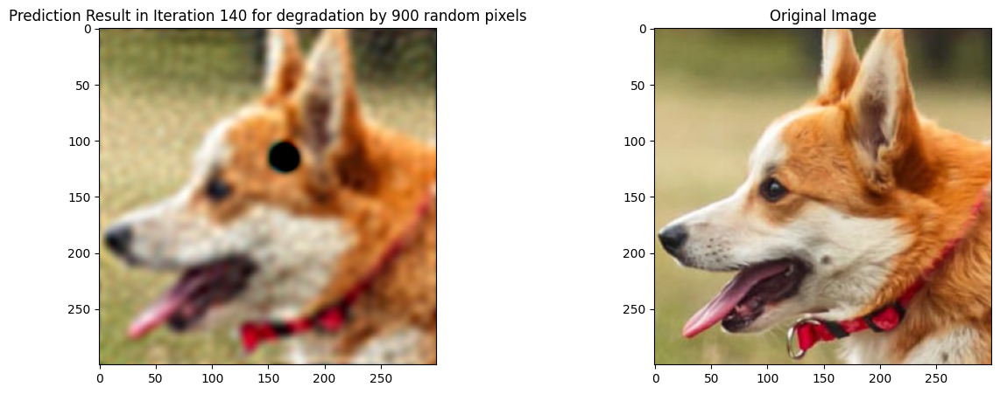

At iteration 141, the PSNR is 26.665039 and MSE loss is 0.002155
At iteration 142, the PSNR is 26.670248 and MSE loss is 0.002153
At iteration 143, the PSNR is 26.675356 and MSE loss is 0.002150
At iteration 144, the PSNR is 26.680355 and MSE loss is 0.002148
At iteration 145, the PSNR is 26.685242 and MSE loss is 0.002145
At iteration 146, the PSNR is 26.689991 and MSE loss is 0.002143
At iteration 147, the PSNR is 26.694534 and MSE loss is 0.002141
At iteration 148, the PSNR is 26.698702 and MSE loss is 0.002139
At iteration 149, the PSNR is 26.702318 and MSE loss is 0.002137


At iteration 150, the PSNR is 26.706005 and MSE loss is 0.002135


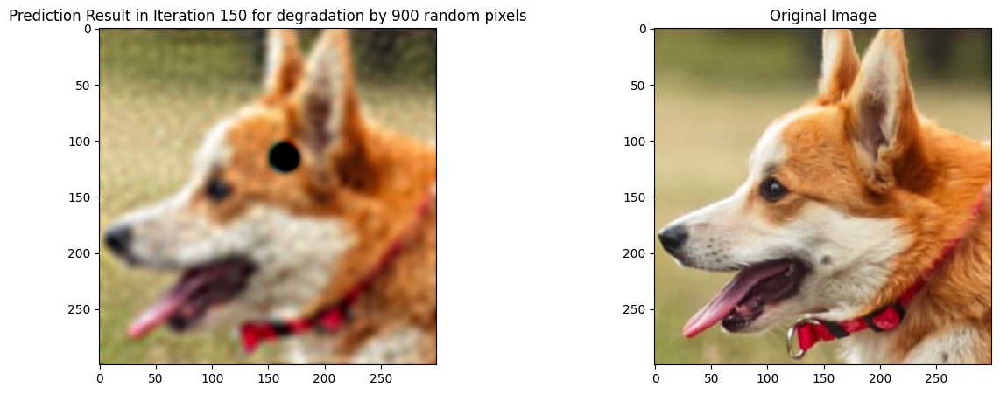

At iteration 151, the PSNR is 26.711187 and MSE loss is 0.002132
At iteration 152, the PSNR is 26.716948 and MSE loss is 0.002130
At iteration 153, the PSNR is 26.720736 and MSE loss is 0.002128
At iteration 154, the PSNR is 26.723921 and MSE loss is 0.002126
At iteration 155, the PSNR is 26.728754 and MSE loss is 0.002124
At iteration 156, the PSNR is 26.733368 and MSE loss is 0.002122
At iteration 157, the PSNR is 26.736488 and MSE loss is 0.002120
At iteration 158, the PSNR is 26.740330 and MSE loss is 0.002118
At iteration 159, the PSNR is 26.744835 and MSE loss is 0.002116
At iteration 160, the PSNR is 26.748192 and MSE loss is 0.002114


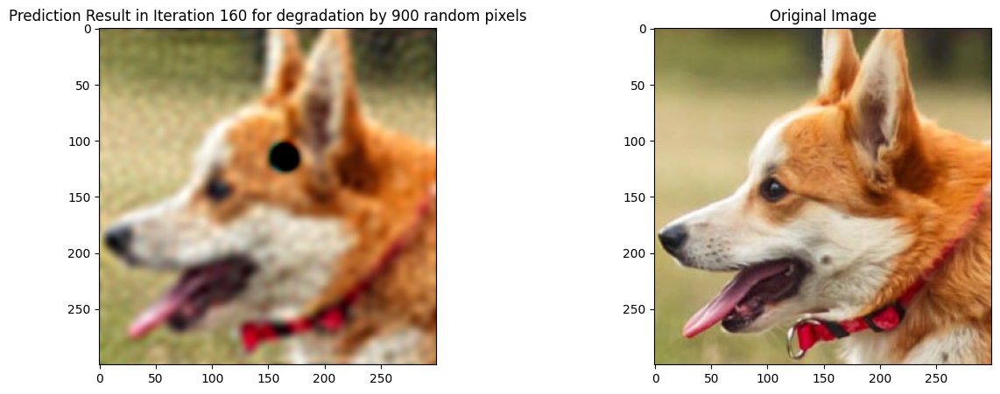

At iteration 161, the PSNR is 26.751514 and MSE loss is 0.002113
At iteration 162, the PSNR is 26.755627 and MSE loss is 0.002111
At iteration 163, the PSNR is 26.759094 and MSE loss is 0.002109
At iteration 164, the PSNR is 26.762173 and MSE loss is 0.002108
At iteration 165, the PSNR is 26.765869 and MSE loss is 0.002106
At iteration 166, the PSNR is 26.769321 and MSE loss is 0.002104
At iteration 167, the PSNR is 26.772278 and MSE loss is 0.002103
At iteration 168, the PSNR is 26.775612 and MSE loss is 0.002101
At iteration 169, the PSNR is 26.778961 and MSE loss is 0.002099


At iteration 170, the PSNR is 26.781849 and MSE loss is 0.002098


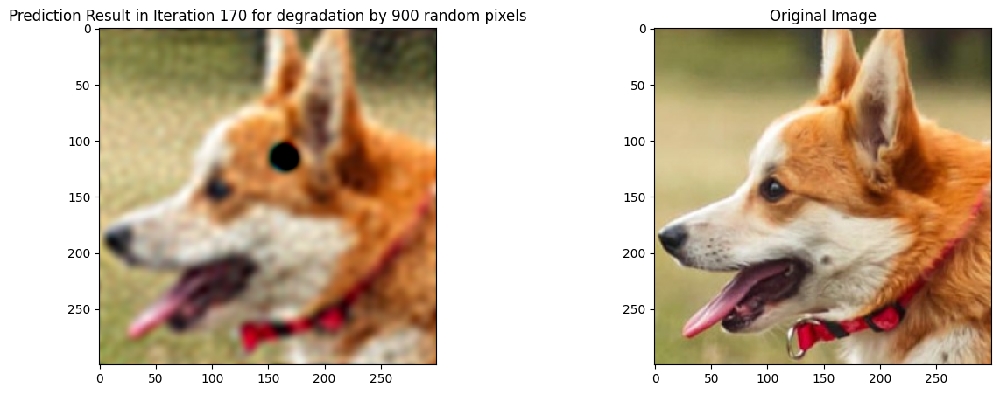

At iteration 171, the PSNR is 26.784893 and MSE loss is 0.002097
At iteration 172, the PSNR is 26.788078 and MSE loss is 0.002095
At iteration 173, the PSNR is 26.790922 and MSE loss is 0.002094
At iteration 174, the PSNR is 26.793737 and MSE loss is 0.002092
At iteration 175, the PSNR is 26.796724 and MSE loss is 0.002091
At iteration 176, the PSNR is 26.799519 and MSE loss is 0.002090
At iteration 177, the PSNR is 26.802170 and MSE loss is 0.002088
At iteration 178, the PSNR is 26.804951 and MSE loss is 0.002087
At iteration 179, the PSNR is 26.807669 and MSE loss is 0.002086


At iteration 180, the PSNR is 26.810211 and MSE loss is 0.002084


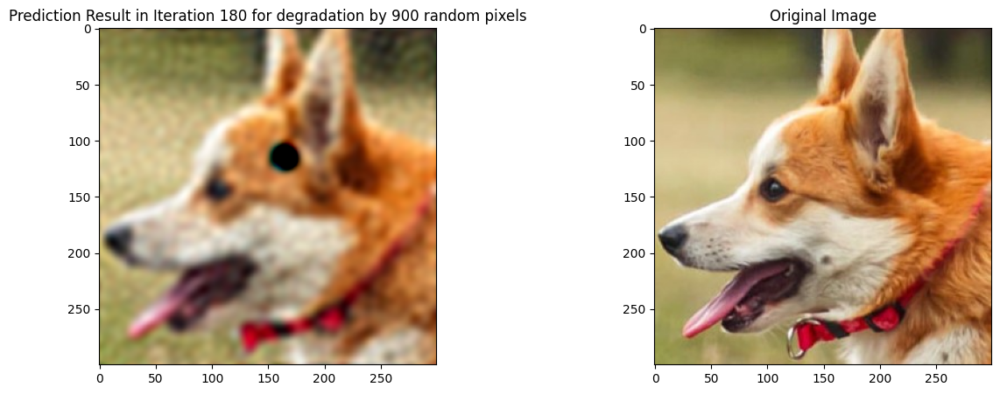

At iteration 181, the PSNR is 26.812798 and MSE loss is 0.002083
At iteration 182, the PSNR is 26.815403 and MSE loss is 0.002082
At iteration 183, the PSNR is 26.817871 and MSE loss is 0.002081
At iteration 184, the PSNR is 26.820293 and MSE loss is 0.002080
At iteration 185, the PSNR is 26.822760 and MSE loss is 0.002078
At iteration 186, the PSNR is 26.825157 and MSE loss is 0.002077
At iteration 187, the PSNR is 26.827465 and MSE loss is 0.002076
At iteration 188, the PSNR is 26.829781 and MSE loss is 0.002075
At iteration 189, the PSNR is 26.832087 and MSE loss is 0.002074


At iteration 190, the PSNR is 26.834314 and MSE loss is 0.002073


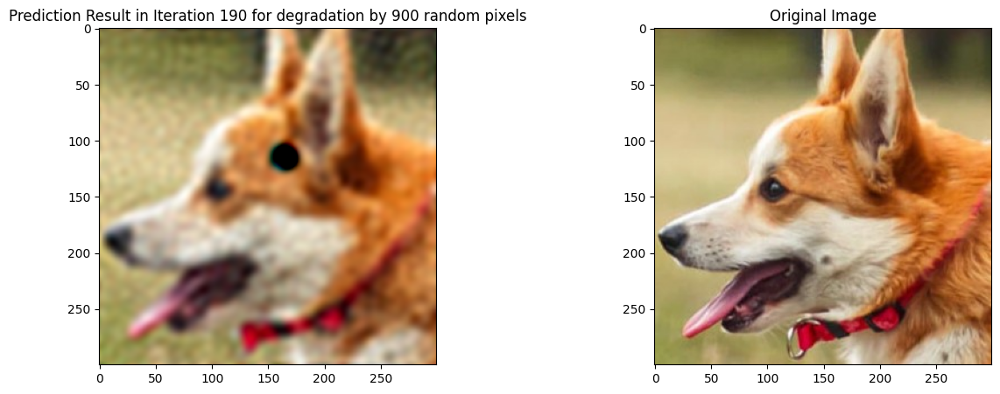

At iteration 191, the PSNR is 26.836502 and MSE loss is 0.002072
At iteration 192, the PSNR is 26.838696 and MSE loss is 0.002071
At iteration 193, the PSNR is 26.840847 and MSE loss is 0.002070
At iteration 194, the PSNR is 26.842939 and MSE loss is 0.002069
At iteration 195, the PSNR is 26.845015 and MSE loss is 0.002068
At iteration 196, the PSNR is 26.847078 and MSE loss is 0.002067
At iteration 197, the PSNR is 26.849096 and MSE loss is 0.002066
At iteration 198, the PSNR is 26.851074 and MSE loss is 0.002065
At iteration 199, the PSNR is 26.853035 and MSE loss is 0.002064


At iteration 200, the PSNR is 26.854973 and MSE loss is 0.002063


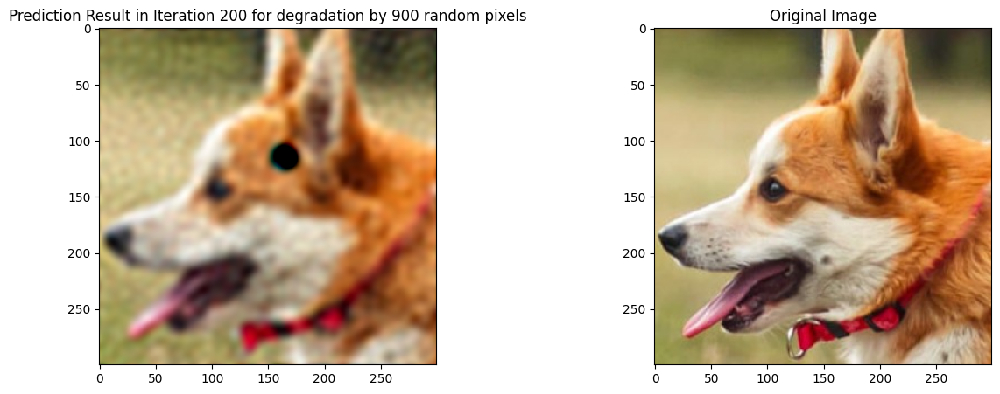

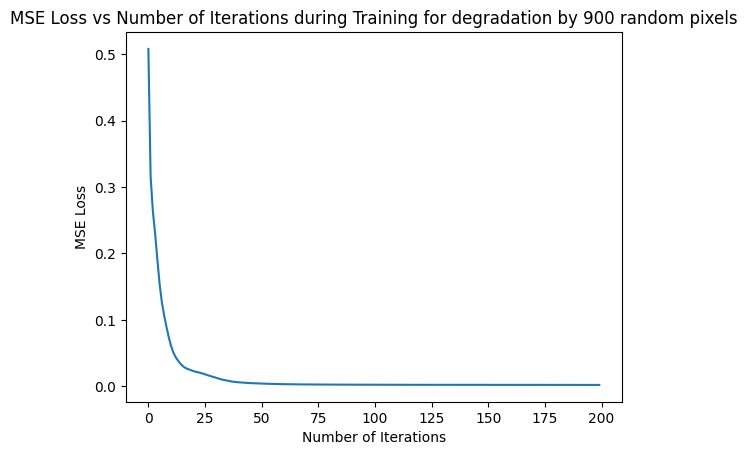

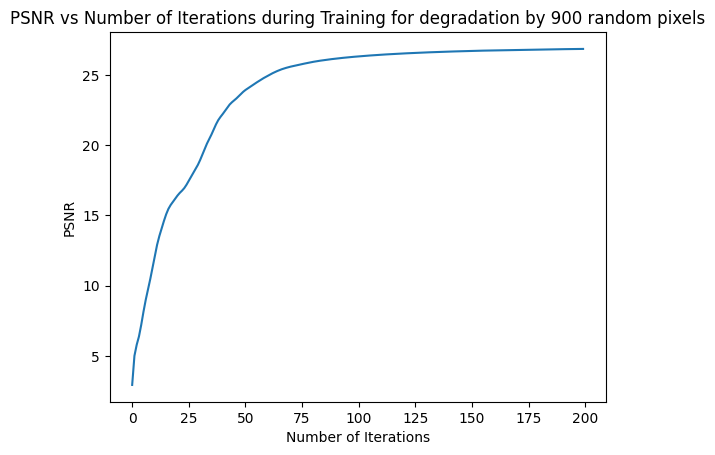

In [15]:

# Create a 3D grid array of coordinates
x = torch.linspace(-1, 1, 300)
y = torch.linspace(-1, 1, 300)
X, Y = torch.meshgrid(x, y)


# Apply the boolean mask to the image array
masked_image = image.clone()
masked_image[boolean_array, ] = -1

# Display the masked image without missing points
plt.figure()
plt.imshow(masked_image)
plt.title(f"Image for degradation by {900} random pixels")
plt.axis('off')
plt.show()


train_coords, train_rgbs = grid[masked_image[:,:,0]!=-1].reshape(-1, 2), image[masked_image!=-1].reshape(-1, 3)  # use every other pixel for training
print(train_coords.shape, train_rgbs.shape)
test_coords = grid.reshape(-1, 2) # use all the pixels for evaluation
SuperReso = RFF_SR(2, 1000, 3, gamma=10).to(device)
optimizer = torch.optim.Adam(SuperReso.parameters(), lr=0.01)
train_mse_arr = []
train_psnr_arr = []

for iter in range(1, 201):
    SuperReso.train()
    optimizer.zero_grad()
    output = SuperReso(train_coords)
    train_loss = F.mse_loss(output, train_rgbs)
    train_loss.backward()
    optimizer.step()
    train_mse_arr.append(train_loss.item())
    train_psnr_arr.append(-10*torch.log10(train_loss))

    with torch.no_grad():
        prediction = SuperReso(test_coords)
        print(f"At iteration {iter}, the PSNR is {-10*torch.log10(train_loss):.6f} and MSE loss is {train_loss.item():.6f}")
    if iter % 10 == 0:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        axes[0].imshow(prediction.reshape(image.shape[0], image.shape[1], image.shape[2]).cpu())
        axes[0].set_title(f"Prediction Result in Iteration {iter} for degradation by {900} random pixels")
        axes[1].imshow(image.cpu())
        axes[1].set_title(f"Original Image")
        plt.show()

plt.figure()
plt.plot(train_mse_arr)
plt.xlabel("Number of Iterations")
plt.ylabel("MSE Loss")
plt.title(f"MSE Loss vs Number of Iterations during Training for degradation by {900} random pixels")
plt.show()

for i in range(len(train_psnr_arr)):
    train_psnr_arr[i] = train_psnr_arr[i].item()
plt.figure()
plt.plot(train_psnr_arr)
plt.xlabel("Number of Iterations")
plt.ylabel("PSNR")
plt.title(f"PSNR vs Number of Iterations during Training for degradation by {900} random pixels")
plt.show()
